<a href="https://colab.research.google.com/github/acastiblancol/Taller2/blob/main/MINE_4101_Taller_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Taller #2
MINE-4101: Applied Data Science  
Univerisdad de los Andes  

**Integrantes:**
* Alvaro Andres Castiblanco
* Lorraine Jazlady Rojas Parra

**Dataset:** Dataset abierto de varios productos de mercado que además
tiene etiquetas suficientes para identificar el tipo de producto
[[dataset](https://github.com/marcusklasson/GroceryStoreDataset)]

**Contexto:** En un supermercado inteligente que busca revolucionar la experiencia de compra, se han implementado tecnologías avanzadas como sensores y cámaras para automatizar el proceso de selección y pago, permitiendo a los clientes tomar productos y salir sin pasar por caja. El objetivo es desarrollar un sistema de automatización que identifique productos en tiempo real a partir de un dataset etiquetado, utilizando modelos de Machine Learning y técnicas de preparación de datos. Con el interés de mejorar la toma de decisiones basada en datos y demostrar el valor agregado de esta tecnología para optimizar la experiencia de compra y la gestión de inventarios

In [ ]:
!pip install tensorflow

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.io import imread
from skimage.transform import resize
import os
import shutil
from pathlib import Path
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from collections import defaultdict
import random
from PIL import Image, ImageEnhance
from glob import glob

### Cargue de datos

In [ ]:
# Descargar el archivo ZIP del dataset
!wget -O GroceryStoreDataset.zip https://github.com/marcusklasson/GroceryStoreDataset/archive/refs/heads/master.zip

# Descomprimir el archivo ZIP
!unzip GroceryStoreDataset.zip -d GroceryStoreDataset


Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_012.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_013.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_014.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_015.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_016.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_017.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_018.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_019.jpg  
  inflating: GroceryStoreDataset/GroceryStoreDataset-master/dataset/test/Fruit/Orange/Orange_020.jpg  
  infl

### 1. Entendimiento y preparación de los datos:

Tipo de fruta: Lemon
  No hay subtipos para Lemon, mostrando imágenes directas.


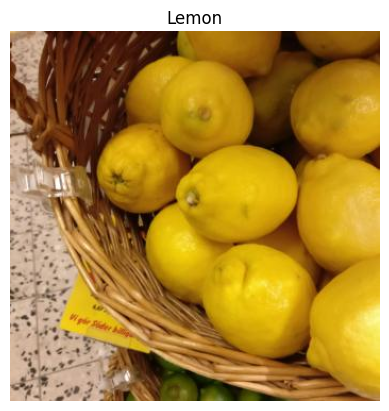

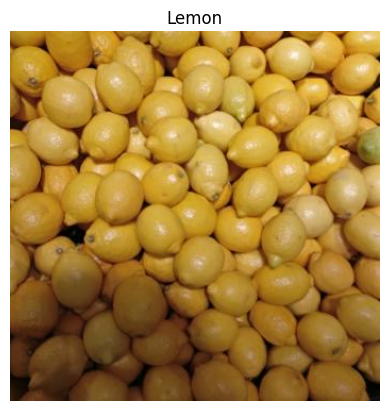

Tipo de fruta: Nectarine
  No hay subtipos para Nectarine, mostrando imágenes directas.


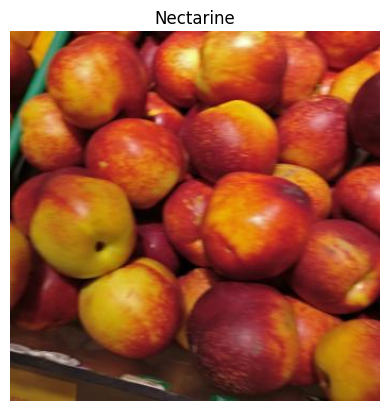

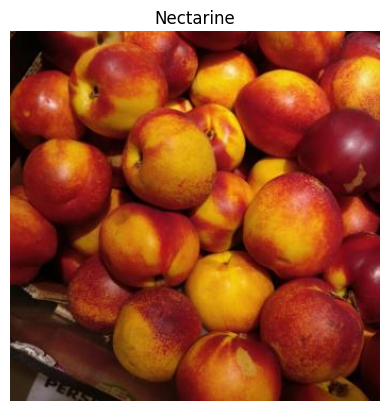

Tipo de fruta: Avocado
  No hay subtipos para Avocado, mostrando imágenes directas.


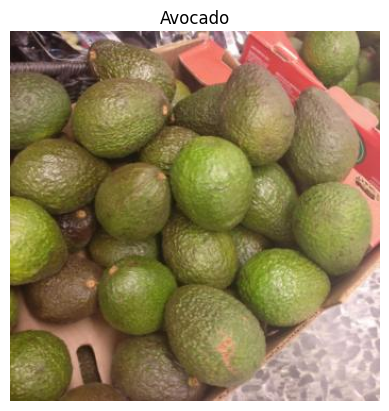

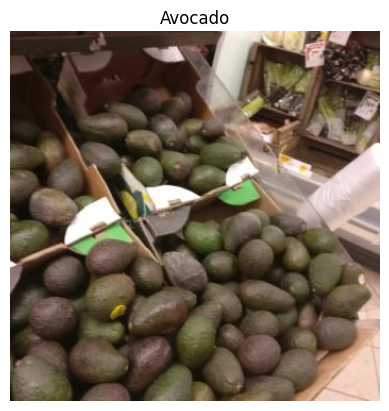

Tipo de fruta: Passion-Fruit
  No hay subtipos para Passion-Fruit, mostrando imágenes directas.


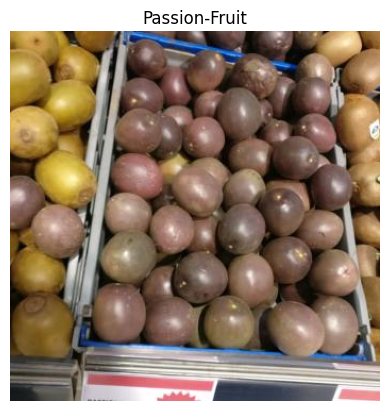

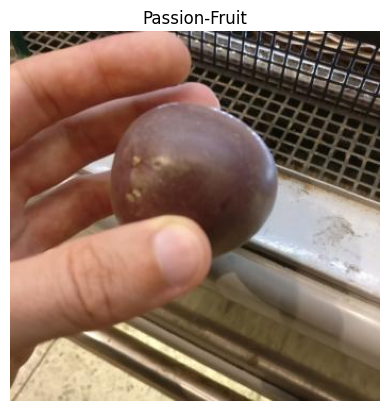

Tipo de fruta: Melon
  Variedad: Cantaloupe


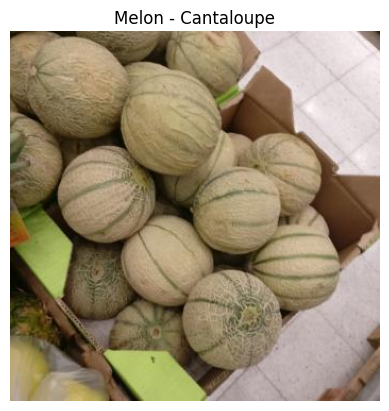

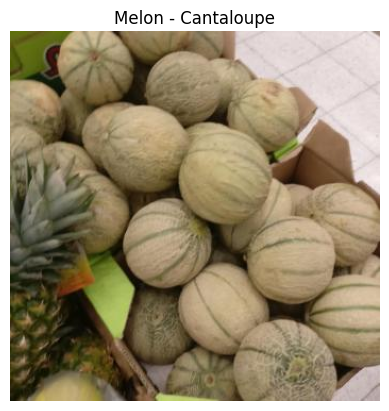

  Variedad: Honeydew-Melon


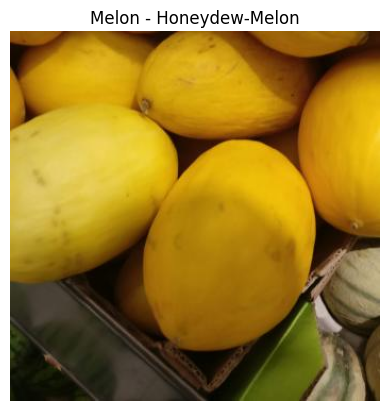

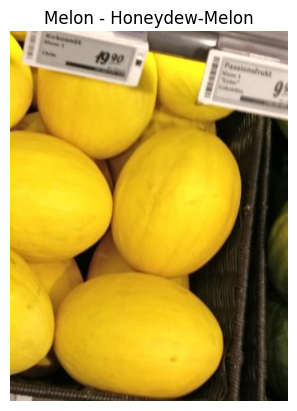

  Variedad: Watermelon


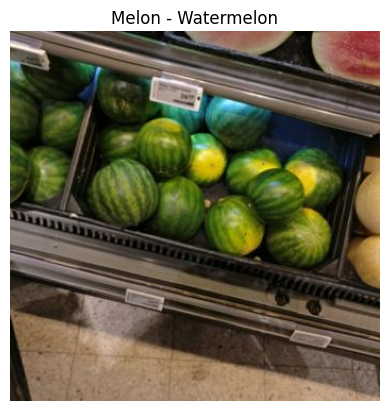

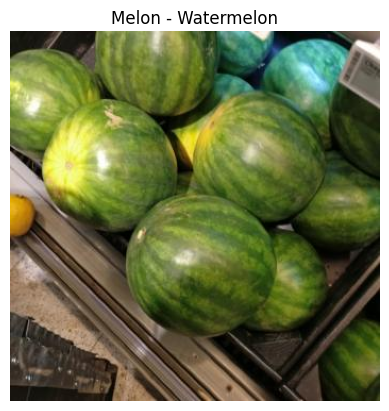

  Variedad: Galia-Melon


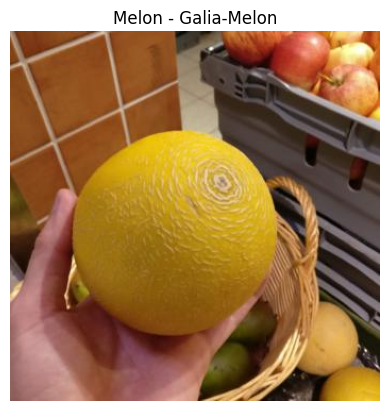

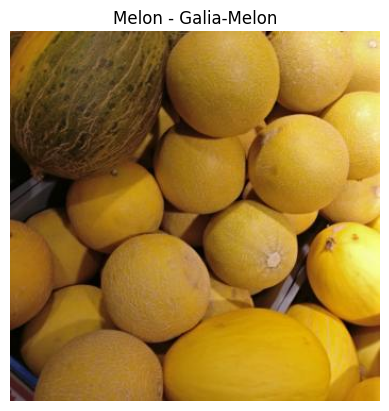

Tipo de fruta: Papaya
  No hay subtipos para Papaya, mostrando imágenes directas.


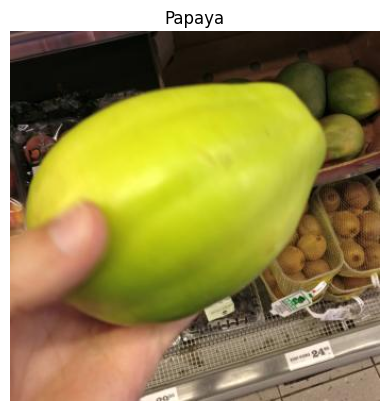

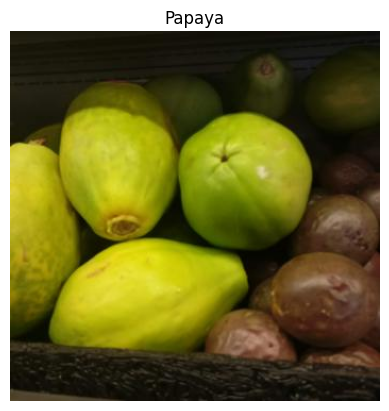

Tipo de fruta: Orange
  No hay subtipos para Orange, mostrando imágenes directas.


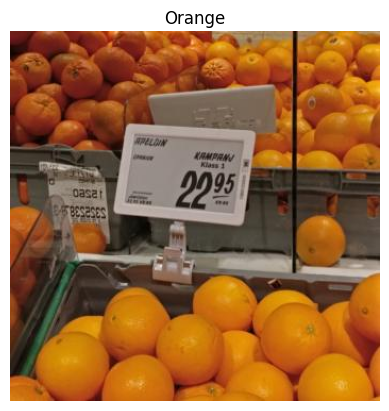

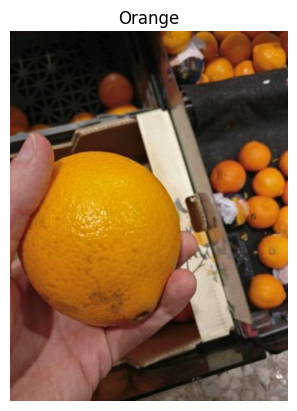

Tipo de fruta: Red-Grapefruit
  No hay subtipos para Red-Grapefruit, mostrando imágenes directas.


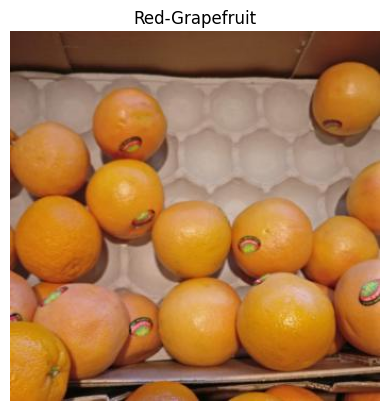

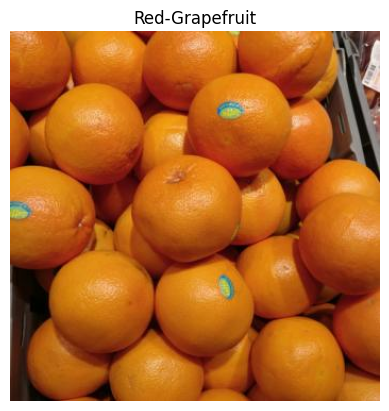

Tipo de fruta: Peach
  No hay subtipos para Peach, mostrando imágenes directas.


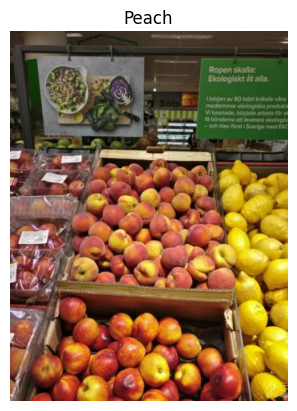

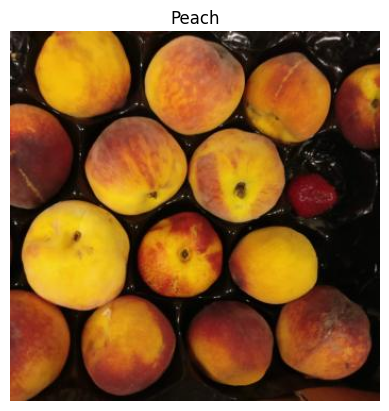

Tipo de fruta: Lime
  No hay subtipos para Lime, mostrando imágenes directas.


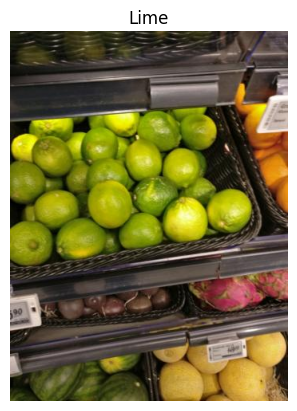

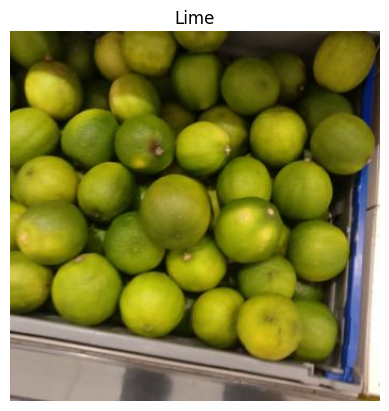

Tipo de fruta: Apple
  Variedad: Golden-Delicious


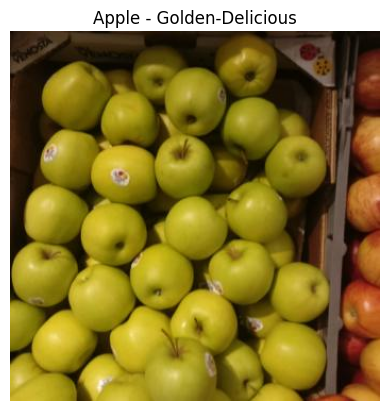

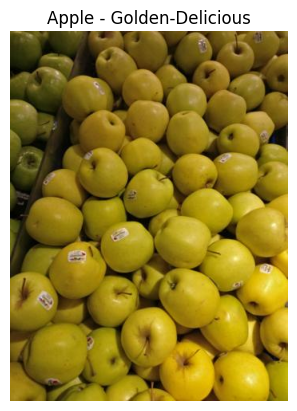

  Variedad: Pink-Lady


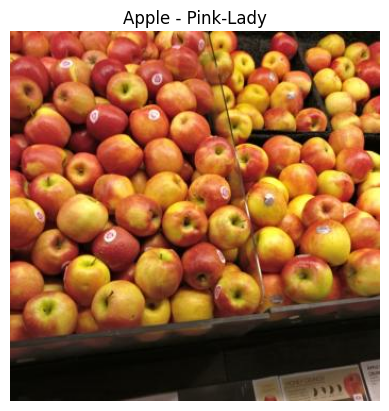

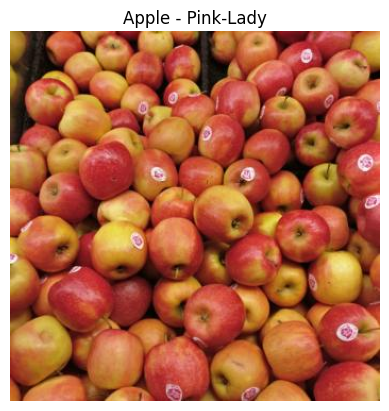

  Variedad: Royal-Gala


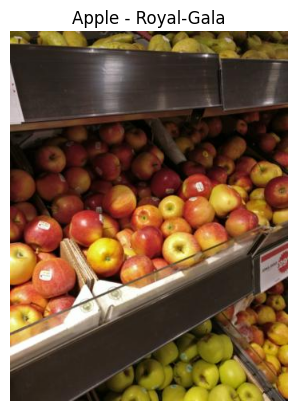

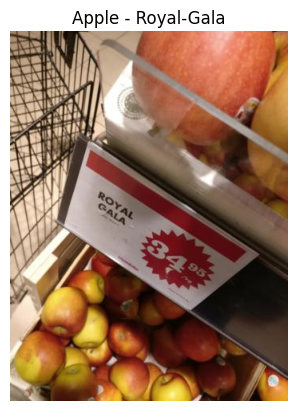

  Variedad: Granny-Smith


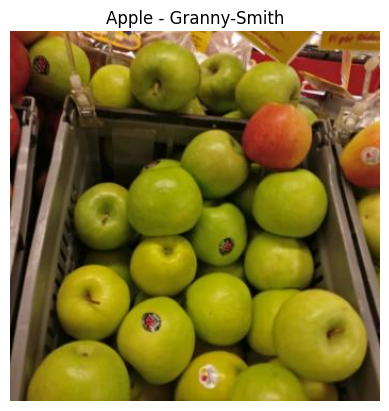

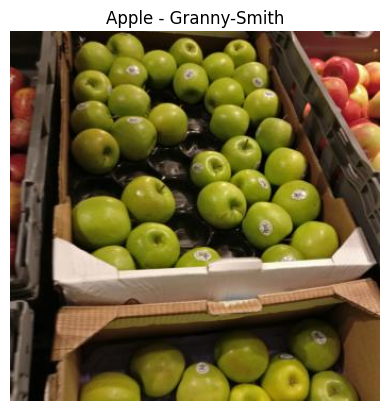

  Variedad: Red-Delicious


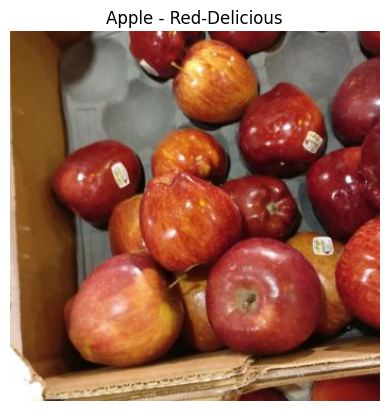

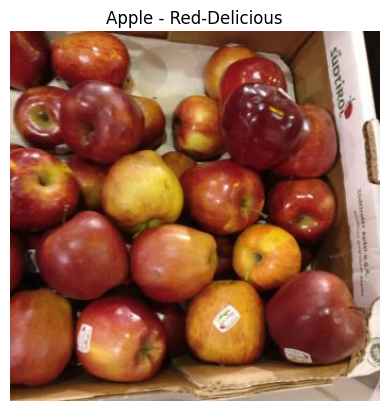

Tipo de fruta: Pomegranate
  No hay subtipos para Pomegranate, mostrando imágenes directas.


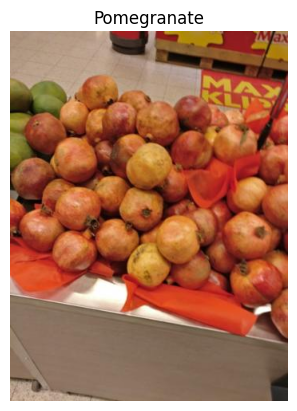

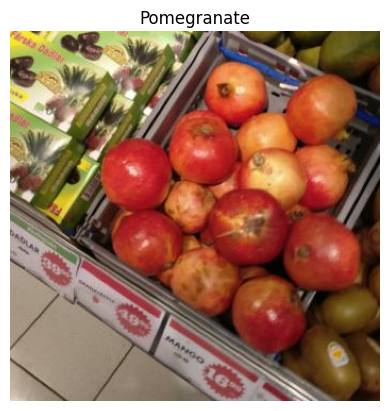

Tipo de fruta: Satsumas
  No hay subtipos para Satsumas, mostrando imágenes directas.


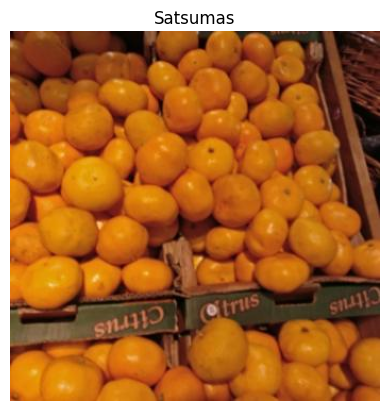

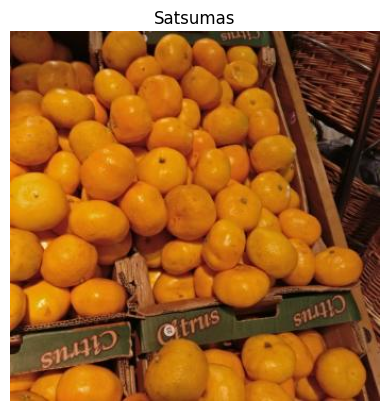

Tipo de fruta: Banana
  No hay subtipos para Banana, mostrando imágenes directas.


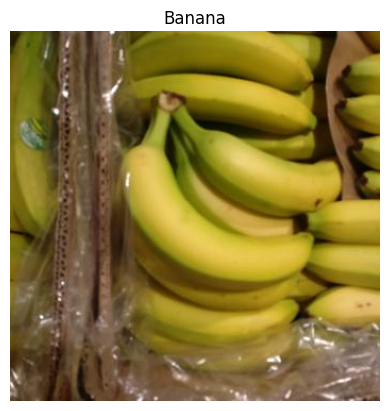

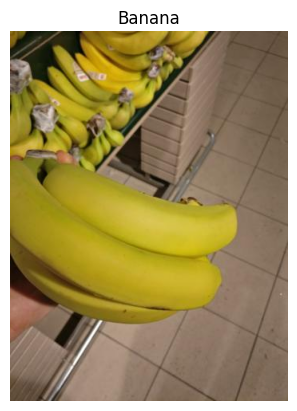

Tipo de fruta: Mango
  No hay subtipos para Mango, mostrando imágenes directas.


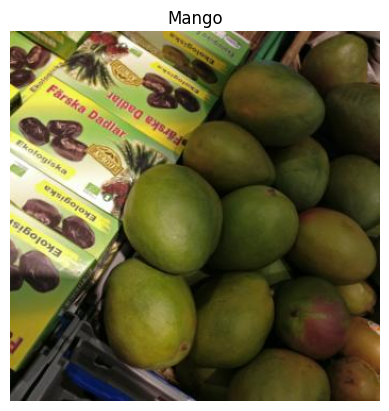

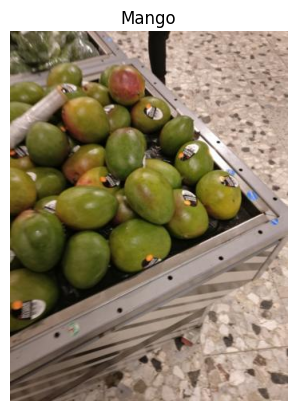

Tipo de fruta: Plum
  No hay subtipos para Plum, mostrando imágenes directas.


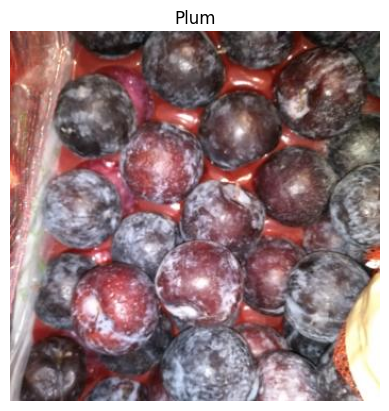

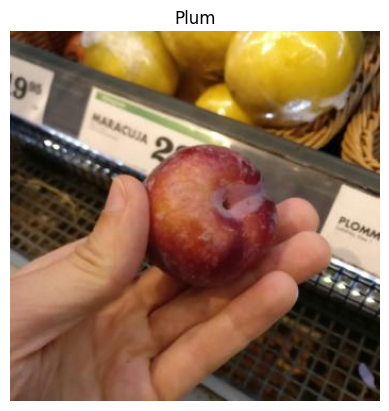

Tipo de fruta: Kiwi
  No hay subtipos para Kiwi, mostrando imágenes directas.


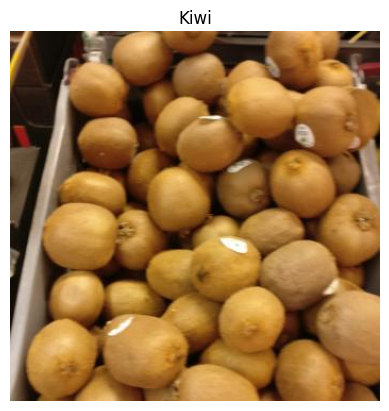

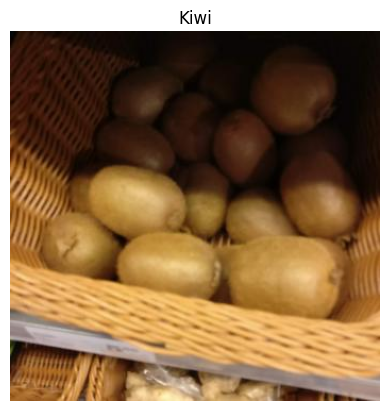

Tipo de fruta: Pineapple
  No hay subtipos para Pineapple, mostrando imágenes directas.


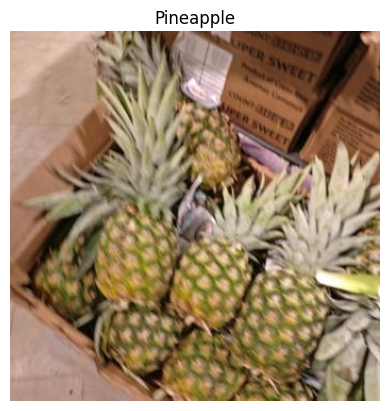

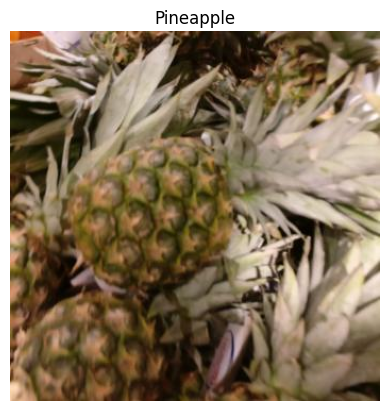

Tipo de fruta: Pear
  Variedad: Kaiser


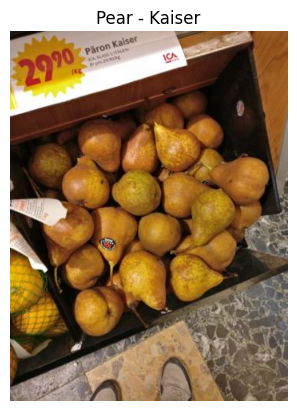

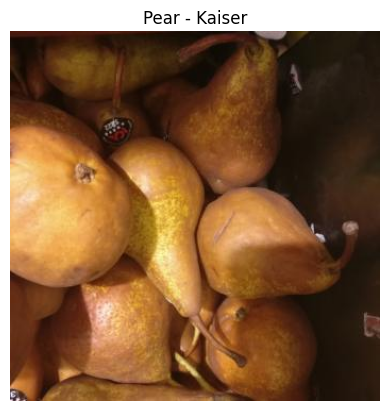

  Variedad: Conference


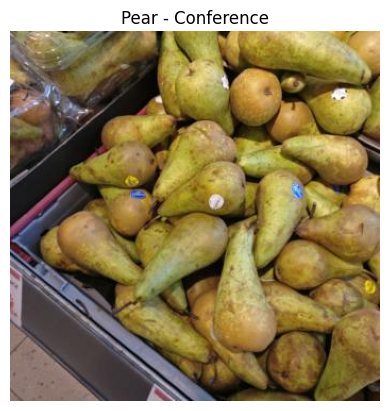

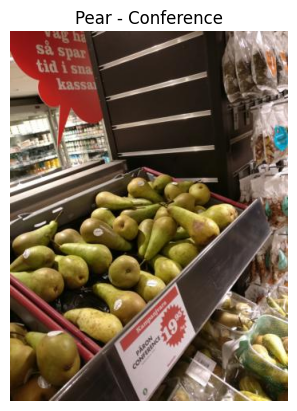

  Variedad: Anjou


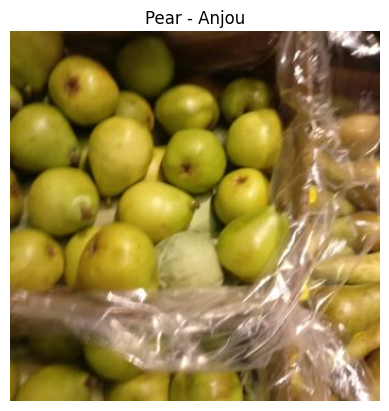

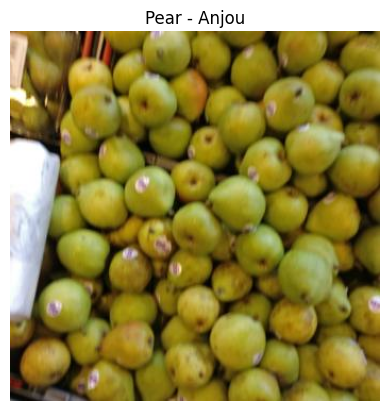

In [ ]:
# Ruta base del dataset (cámbiala según sea necesario)
ROOT_DIR = '/content/GroceryStoreDataset/GroceryStoreDataset-master/dataset'
data_dir = (f'{ROOT_DIR}/test/Fruit')

# Recorrer las categorías en la carpeta 'train/Fruit'
for fruit_type in os.listdir(data_dir):
    fruit_type_path = os.path.join(data_dir, fruit_type)
    if os.path.isdir(fruit_type_path):
        print(f"Tipo de fruta: {fruit_type}")

        # Revisar si existen subcarpetas (variedades) dentro de esta fruta
        subfolders = [f for f in os.listdir(fruit_type_path) if os.path.isdir(os.path.join(fruit_type_path, f))]

        if subfolders:
            # Si hay subcarpetas, recórrelas como variedades
            for variety in subfolders:
                variety_path = os.path.join(fruit_type_path, variety)
                print(f"  Variedad: {variety}")

                # Mostrar algunas imágenes de cada variedad
                img_files = os.listdir(variety_path)
                for img_file in img_files[:2]:  # Muestra las primeras 2 imágenes de cada variedad
                    img_path = os.path.join(variety_path, img_file)
                    img = Image.open(img_path)

                    # Mostrar la imagen
                    plt.imshow(img)
                    plt.title(f"{fruit_type} - {variety}")
                    plt.axis('off')
                    plt.show()
        else:
            # Si no hay subcarpetas, cargar imágenes directamente de la carpeta de la fruta
            print(f"  No hay subtipos para {fruit_type}, mostrando imágenes directas.")
            img_files = os.listdir(fruit_type_path)
            for img_file in img_files[:2]:  # Muestra las primeras 2 imágenes de la fruta sin subtipo
                img_path = os.path.join(fruit_type_path, img_file)
                img = Image.open(img_path)

                # Mostrar la imagen
                plt.imshow(img)
                plt.title(f"{fruit_type}")
                plt.axis('off')
                plt.show()


(348, 348, 3)


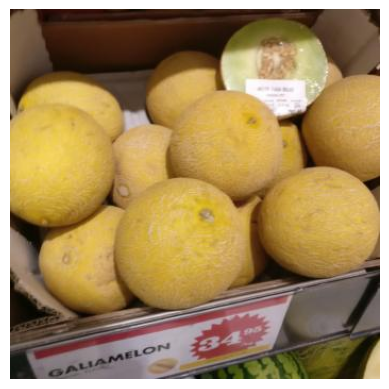

(348, 348, 3)


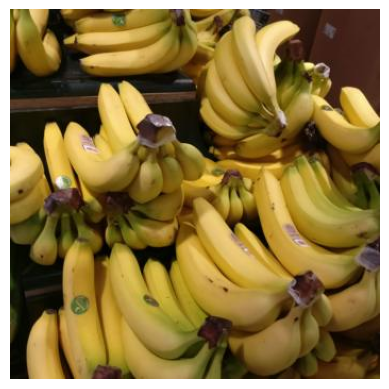

(348, 348, 3)


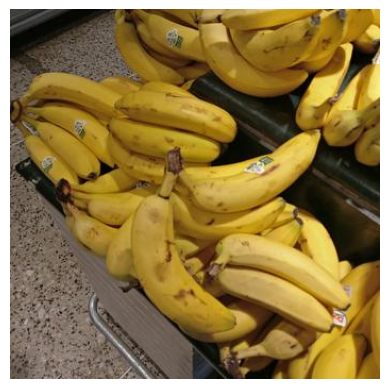

In [ ]:
img = imread( f'{ROOT_DIR}/test/Fruit/Melon/Galia-Melon/Galia-Melon_008.jpg')
plt.imshow(img)
print(img.shape)
plt.axis('off')
plt.show()

img = imread(f'{ROOT_DIR}/train/Fruit/Banana/Banana_001.jpg')
plt.imshow(img)
print(img.shape)
plt.axis('off')
plt.show()

img = imread(f'{ROOT_DIR}/val/Fruit/Banana/Banana_001.jpg')
plt.imshow(img)
print(img.shape)
plt.axis('off')
plt.show()

In [ ]:
# Inicializar contadores para categorías generales y grupos principales
category_counts = defaultdict(int)
group_counts = defaultdict(int)
group_categories = defaultdict(set)

# Definir las palabras clave para identificar los grupos principales
fruits_keywords = ["Fruit"]
vegetables_keywords = ["Vegetables"]
packages_keywords = ["Packages"]

# Leer las rutas de las imágenes en train.txt
with open(f'{ROOT_DIR}/train.txt', 'r') as file:
    for line in file:
        # Obtener la ruta y extraer las carpetas de nivel superior
        path_parts = line.strip().split('/')

        # Identificar el grupo principal
        if any(keyword in path_parts for keyword in fruits_keywords):
            group = "Fruit"
        elif any(keyword in path_parts for keyword in vegetables_keywords):
            group = "Vegetable"
        elif any(keyword in path_parts for keyword in packages_keywords):
            group = "Package"
        else:
            group = "Unknown"

        # Incrementar el contador del grupo principal
        group_counts[group] += 1

        # Obtener la categoría general (por ejemplo, Apple, Banana)
        category_name = path_parts[2]  # Esto asume que la estructura es train/Fruit/Apple/etc.
        category_counts[category_name] += 1

        # Guardar las categorías únicas en cada grupo
        group_categories[group].add(category_name)

# Mostrar el conteo de imágenes agrupadas por categorías generales y por grupos principales
print("Conteo de imágenes por categoría general:")
for category, count in category_counts.items():
    print(f"{category}: {count} imágenes")

print("\nConteo de imágenes por grupo principal:")
for group, count in group_counts.items():
    print(f"{group}: {count} imágenes")

# Calcular el promedio de imágenes por categoría en cada grupo
print("\nPromedio de imágenes por categoría en cada grupo principal:")

for group, total_images in group_counts.items():
    num_categories = len(group_categories[group])
    average_images_per_category = total_images / num_categories if num_categories > 0 else 0
    print(f"{group}: {average_images_per_category:.2f} imágenes por categoría ({num_categories} categorías en total)")


Conteo de imágenes por categoría general:
Apple: 278 imágenes
Avocado: 41 imágenes
Banana: 45 imágenes
Kiwi: 46 imágenes
Lemon: 42 imágenes
Lime: 31 imágenes
Mango: 32 imágenes
Melon: 154 imágenes
Nectarine: 36 imágenes
Orange: 57 imágenes
Papaya: 21 imágenes
Passion-Fruit: 28 imágenes
Peach: 37 imágenes
Pear: 116 imágenes
Pineapple: 26 imágenes
Plum: 22 imágenes
Pomegranate: 26 imágenes
Red-Grapefruit: 34 imágenes
Satsumas: 70 imágenes
Juice: 247 imágenes
Milk: 182 imágenes
Oatghurt: 33 imágenes
Oat-Milk: 32 imágenes
Sour-Cream: 48 imágenes
Sour-Milk: 30 imágenes
Soyghurt: 51 imágenes
Soy-Milk: 60 imágenes
Yoghurt: 181 imágenes
Asparagus: 16 imágenes
Aubergine: 22 imágenes
Cabbage: 19 imágenes
Carrots: 43 imágenes
Cucumber: 28 imágenes
Garlic: 25 imágenes
Ginger: 19 imágenes
Leek: 23 imágenes
Brown-Cap-Mushroom: 39 imágenes
Onion: 38 imágenes
Pepper: 112 imágenes
Potato: 75 imágenes
Red-Beet: 18 imágenes
Tomato: 127 imágenes
Zucchini: 30 imágenes

Conteo de imágenes por grupo principa

In [ ]:
# Configuración de rutas y parámetros
dataset_dir = f'{ROOT_DIR}/train/Packages'  # Ruta donde están las imágenes originales de las categorías de paquetes
target_count = 255  # Objetivo de imágenes para cada categoría

# Definir las categorías y el número de imágenes actuales
categories = {
    "Juice": [247, 19],
    "Milk": [182, 20],
    "Oatghurt": [33, 21],
    "Oat-Milk": [32, 22],
    "Sour-Cream": [48, 23],
    "Sour-Milk": [30, 24],
    "Soyghurt": [51, 25],
    "Soy-Milk": [60, 26],
    "Yoghurt": [181, 27]
}

# Crear carpeta agrupada por categoría
for category in categories:
    category = category
    category_path = Path(dataset_dir) / category
    unified_category_path = Path(dataset_dir) / f'Unified_{category}'
    unified_category_path.mkdir(exist_ok=True, parents=True)

    # Mover imágenes de subcategorías a la carpeta unificada
    for subfolder in category_path.iterdir():
        if subfolder.is_dir():
            for img_file in subfolder.glob('*.jpg'):
                shutil.copy(img_file, unified_category_path)



In [ ]:
# Funciones de aumento de datos

datagen = ImageDataGenerator(rotation_range=20, width_shift_range=0.1, height_shift_range=0.1,
                             shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')
for category in categories:
    unified_category_path = Path(dataset_dir) / f'Unified_{category}'
    image_paths = list(unified_category_path.glob('*.jpg'))
    train_paths = f'train/Packages/Unified_{category}/'

    if len(image_paths) < target_count:
        needed_images = target_count - len(image_paths)
        for i in tqdm(range(needed_images), desc=f'Aumentando {category}'):
            img_path = image_paths[i % len(image_paths)]
            img = tf.keras.preprocessing.image.load_img(img_path) # Now 'tf' is defined and can be used
            img_array = tf.keras.preprocessing.image.img_to_array(img)
            img_array = img_array.reshape((1,) + img_array.shape)
            save_path = unified_category_path / f"aug_{i}_{img_path.stem}.jpg"
            for _ in datagen.flow(img_array, batch_size=1, save_to_dir=unified_category_path, save_prefix='aug', save_format='jpg'):
                break  # Genera una imagen aumentada por ciclo
print("Aumento de datos completado.")


Aumentando Yoghurt: 100%|██████████| 74/74 [00:02<00:00, 30.15it/s]

Aumento de datos completado.


In [ ]:
# Actualizar train.txt con nuevas rutas
train_txt_path = f'{ROOT_DIR}/train_packages_only.txt'  # Ruta al archivo train.txt

with open(train_txt_path, 'a') as file:
    for category in categories:
        unified_category_path = Path(dataset_dir) / f'Unified_{category}'
        for img_file in unified_category_path.glob('*.jpg'):
            file.write(f"train/Packages/Unified_{category}/{img_file.name}, 0, {categories[category][1]}\n")

print("Archivo train.txt actualizado.")

Archivo train.txt actualizado.


In [ ]:
# Ruta del archivo original y del nuevo archivo
original_file_val = f'{ROOT_DIR}/val.txt'
filtered_file_val = f'{ROOT_DIR}/val_packages_only.txt'
original_file_test = f'{ROOT_DIR}/test.txt'
filtered_file_test = f'{ROOT_DIR}/test_packages_only.txt'

def filter_txt_file(original_file, filtered_file, target_category):
  # Filtrar líneas que contienen "Packages"
  with open(original_file, 'r') as infile, open(filtered_file, 'w') as outfile:
      for line in infile:
          if 'Packages' in line:
              outfile.write(line)

  print(f"Archivo filtrado de {target_category} creado: {filtered_file}")

filter_txt_file(original_file_val, filtered_file_val, 'val')
filter_txt_file(original_file_test, filtered_file_test, 'test')

Archivo filtrado de val creado: /content/GroceryStoreDataset/GroceryStoreDataset-master/dataset/val_packages_only.txt
Archivo filtrado de test creado: /content/GroceryStoreDataset/GroceryStoreDataset-master/dataset/test_packages_only.txt


In [ ]:
# Inicializar contadores
unified_image_counts = defaultdict(int)
package_counts = {'val': 0, 'test': 0}  # Contador de imágenes en val.txt y test.txt para "Packages"

# Definir las palabras clave para identificar los grupos principales
packages_keywords = ["Packages"]
unified_prefix = "Unified_"

# Función para contar imágenes en un archivo de texto específico
def count_images_in_file(file_path, group_keyword):
    count = 0
    with open(file_path, 'r') as file:
        for line in file:
            path_parts = line.strip().split('/')

            # Verificar si la imagen está en el grupo 'Packages'
            if any(keyword in path_parts for keyword in packages_keywords):
                count += 1
    return count

# Leer las rutas de las imágenes en train.txt
with open(f'{ROOT_DIR}/train_packages_only.txt', 'r') as file:
    for line in file:
        path_parts = line.strip().split('/')

        # Comprobar si la subcategoría comienza con "Unified_" y contar imágenes
        if len(path_parts) > 2 and path_parts[2].startswith(unified_prefix):
            category = path_parts[2]
            unified_image_counts[category] += 1

# Contar las imágenes de "Packages" en val.txt y test.txt
package_counts['val'] = count_images_in_file(f'{ROOT_DIR}/val_packages_only.txt', 'Packages')
package_counts['test'] = count_images_in_file(f'{ROOT_DIR}/test_packages_only.txt', 'Packages')


# Mostrar resultados
print("Cantidad de imágenes por categorias de paquetes:")
for category, count in unified_image_counts.items():
    print(f"{category}: {count} imágenes")

total_unified_images = sum(unified_image_counts.values())
print(f"\nTotal de imágenes de 'Packages' en train.txt': {total_unified_images} imágenes")
print(f"Total de imágenes de 'Packages' en val.txt: {package_counts['val']} imágenes")
print(f"Total de imágenes  de'Packages' en test.txt: {package_counts['test']} imágenes")


Cantidad de imágenes por categorias de paquetes:
Unified_Juice: 255 imágenes
Unified_Milk: 254 imágenes
Unified_Oatghurt: 251 imágenes
Unified_Oat-Milk: 253 imágenes
Unified_Sour-Cream: 253 imágenes
Unified_Sour-Milk: 252 imágenes
Unified_Soyghurt: 252 imágenes
Unified_Soy-Milk: 251 imágenes
Unified_Yoghurt: 254 imágenes

Total de imágenes de 'Packages' en train.txt': 2275 imágenes
Total de imágenes de 'Packages' en val.txt: 100 imágenes
Total de imágenes  de'Packages' en test.txt: 781 imágenes



**Análisis Inicial de Datos**

1.	Dimensiones del Dataset:
  * Clases específicas: El dataset contiene un total de 81 clases específicas.
  * Categorías generales: Hay 43 categorías generales.
  * Esta segregación permite una clasificación granular y está diseñada para asegurar que el modelo sea viable y aplicable a las necesidades de la empresa.

La diversidad de clases y categorías permite abordar problemas de clasificación complejos con un enfoque detallado, garantizando que el modelo pueda distinguir entre una amplia variedad de productos. Dado que se trata de un modelo inicial, y con el objetivo de reducir costos en esta etapa, se plantea una prueba de concepto (PoC) centrada exclusivamente en los productos empaquetados, lo que permite validar el enfoque con una muestra representativa y controlada.

2.	Distribución de Imágenes:
  * Imágenes de entrenamiento: 2,282
  * Imágenes de validación: 100
  * Imágenes de prueba: 781

Esta distribución asegura un equilibrio adecuado entre las etapas de entrenamiento, validación y prueba del modelo.
Una distribución proporcional de las imágenes es adecuada para entrenar, validar y probar el modelo, minimizando el riesgo de sobreajuste y garantizando un rendimiento consistente en datos nuevos.

3.	Características de las Imágenes:
  * Cada imagen tiene un tamaño de 348 x 348 píxeles y está representada en 3 canales de color.
  * Todas las imágenes están etiquetadas con una clase específica, lo que facilita su utilización en tareas de clasificación.
  * Algunas clases incluyen imágenes icónicas y archivos de descripción, los cuales podrían emplearse para explorar características visuales y textuales adicionales de los productos.

Cada imagen tiene un tamaño de 348 X 348 pixeles con color a 3 canales, estas cuentan con las etiquetas necesarias para realizar tareas de clasificación y explorar modelos multimodales, lo que enriquece el análisis del dataset.
Esta información establece las bases para un análisis más profundo y el desarrollo de modelos de Machine Learning efectivos.



###2. Entrenamiento del modelo de Machine Learning

####2.1 Preparación de los datos

In [ ]:
import os
import torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Crear diccionario de mapeo
label_mapping = {19: 0, 20: 1, 21: 2, 22: 3, 23: 4, 24: 5, 25: 6, 26: 7, 27: 8}

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, txt_file, transform=None):
        self.image_paths = []
        self.labels = []
        self.transform = transform

        # Leer el archivo .txt y procesar rutas e índices de etiquetas
        with open(txt_file, "r") as file:
            for line in file:
                parts = line.strip().split(",")
                path = f'/content/GroceryStoreDataset/GroceryStoreDataset-master/dataset/{parts[0].strip()}'
                label = int(parts[2])  # Convertir a entero
                self.image_paths.append(path)
                self.labels.append(label_mapping[label])  # Aplicar mapeo

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label



In [ ]:
# Definir transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Redimensionar las imágenes
    transforms.ToTensor(),          # Convertir a tensor
])

# Rutas a los archivos
train_txt = f'{ROOT_DIR}/train_packages_only.txt'
val_txt = f'{ROOT_DIR}/val_packages_only.txt'
test_txt = f'{ROOT_DIR}/test_packages_only.txt'

# Crear conjuntos de datos
train_dataset = CustomDataset(train_txt, transform=transform)
val_dataset = CustomDataset(val_txt, transform=transform)
test_dataset = CustomDataset(test_txt, transform=transform)

# Crear DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [ ]:
# Ejemplo de iteración sobre el DataLoader de entrenamiento
for images, labels in train_loader:
    print(images.shape)  # Dimensiones del batch de imágenes
    print(labels)        # Etiquetas correspondientes
    break

torch.Size([32, 3, 128, 128])
tensor([3, 5, 8, 4, 5, 2, 6, 3, 8, 2, 6, 1, 3, 8, 5, 1, 7, 8, 6, 8, 2, 1, 5, 1,
        5, 3, 2, 4, 2, 6, 6, 6])


####2.2 Definición de modelos

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet18, mobilenet_v2

# Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Número de clases (según las categorías: 19 a 27 => 9 clases)
num_classes = 9

# Modelo ResNet18
model_resnet = resnet18(pretrained=True)
model_resnet.fc = nn.Linear(model_resnet.fc.in_features, num_classes)
model_resnet = model_resnet.to(device)

# Modelo MobileNetV2
model_mobilenet = mobilenet_v2(pretrained=True)
model_mobilenet.classifier[1] = nn.Linear(model_mobilenet.last_channel, num_classes)
model_mobilenet = model_mobilenet.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 135MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed i

####2.3 Entrenamiento de los modelos

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        # Entrenamiento
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        train_accuracy = 100. * correct / total
        print(f"[Epoch {epoch+1}] Train Loss: {running_loss:.4f}, Accuracy: {train_accuracy:.2f}%")

        # Validación
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = outputs.max(1)
                total += labels.size(0)
                correct += predicted.eq(labels).sum().item()

        val_accuracy = 100. * correct / total
        print(f"[Epoch {epoch+1}] Validation Loss: {val_loss:.4f}, Accuracy: {val_accuracy:.2f}%")

    return model


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer_resnet = optim.Adam(model_resnet.parameters(), lr=0.001)
optimizer_mobilenet = optim.Adam(model_mobilenet.parameters(), lr=0.001)

# Entrenar ambos modelos
print("Entrenando ResNet18...")
trained_resnet = train_model(model_resnet, train_loader, val_loader, criterion, optimizer_resnet, num_epochs=10)

print("\nEntrenando MobileNetV2...")
trained_mobilenet = train_model(model_mobilenet, train_loader, val_loader, criterion, optimizer_mobilenet, num_epochs=10)


Entrenando ResNet18...
[Epoch 1] Train Loss: 21.9726, Accuracy: 89.05%
[Epoch 1] Validation Loss: 19.8431, Accuracy: 48.00%
[Epoch 2] Train Loss: 8.1138, Accuracy: 97.05%
[Epoch 2] Validation Loss: 2.2975, Accuracy: 81.00%
[Epoch 3] Train Loss: 8.1423, Accuracy: 96.53%
[Epoch 3] Validation Loss: 4.2032, Accuracy: 79.00%
[Epoch 4] Train Loss: 6.1381, Accuracy: 97.67%
[Epoch 4] Validation Loss: 10.2291, Accuracy: 69.00%
[Epoch 5] Train Loss: 4.4793, Accuracy: 98.29%
[Epoch 5] Validation Loss: 3.1221, Accuracy: 77.00%
[Epoch 6] Train Loss: 3.4039, Accuracy: 98.77%
[Epoch 6] Validation Loss: 5.4641, Accuracy: 74.00%
[Epoch 7] Train Loss: 2.2047, Accuracy: 98.90%
[Epoch 7] Validation Loss: 1.1099, Accuracy: 92.00%
[Epoch 8] Train Loss: 4.2149, Accuracy: 98.95%
[Epoch 8] Validation Loss: 2.5066, Accuracy: 83.00%
[Epoch 9] Train Loss: 5.7971, Accuracy: 97.49%
[Epoch 9] Validation Loss: 5.0838, Accuracy: 76.00%
[Epoch 10] Train Loss: 7.7071, Accuracy: 97.23%
[Epoch 10] Validation Loss: 2.0277,

In [ ]:
def evaluate_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    class_correct = [0] * num_classes
    class_total = [0] * num_classes

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            # Por clase
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += (predicted[i] == label).item()
                class_total[label] += 1

    overall_accuracy = 100. * correct / total
    print(f"Test Accuracy: {overall_accuracy:.2f}%")

    # Por clase
    for i in range(num_classes):
        if class_total[i] > 0:
            print(f"Accuracy de la clase {i}: {100. * class_correct[i] / class_total[i]:.2f}%")
        else:
            print(f"Clase {i} sin imágenes en test.")

    return overall_accuracy

In [ ]:
print("Evaluando ResNet18...")
accuracy_resnet = evaluate_model(trained_resnet, test_loader)

print("\nEvaluando MobileNetV2...")
accuracy_mobilenet = evaluate_model(trained_mobilenet, test_loader)


Evaluando ResNet18...
Test Accuracy: 93.98%
Accuracy de la clase 0: 90.87%
Accuracy de la clase 1: 98.78%
Accuracy de la clase 2: 100.00%
Accuracy de la clase 3: 93.55%
Accuracy de la clase 4: 95.12%
Accuracy de la clase 5: 84.21%
Accuracy de la clase 6: 78.72%
Accuracy de la clase 7: 100.00%
Accuracy de la clase 8: 95.35%

Evaluando MobileNetV2...
Test Accuracy: 95.65%
Accuracy de la clase 0: 98.17%
Accuracy de la clase 1: 91.46%
Accuracy de la clase 2: 100.00%
Accuracy de la clase 3: 100.00%
Accuracy de la clase 4: 80.49%
Accuracy de la clase 5: 89.47%
Accuracy de la clase 6: 97.87%
Accuracy de la clase 7: 96.55%
Accuracy de la clase 8: 98.26%


In [ ]:
if accuracy_resnet > accuracy_mobilenet:
    print("El modelo ResNet18 es el mejor con una precisión de {:.2f}%".format(accuracy_resnet))
    best_model = trained_resnet
else:
    print("El modelo MobileNetV2 es el mejor con una precisión de {:.2f}%".format(accuracy_mobilenet))
    best_model = trained_mobilenet


El modelo MobileNetV2 es el mejor con una precisión de 95.65%


In [ ]:
torch.save(best_model.state_dict(), "best_model.pth")
print("El mejor modelo ha sido guardado como 'best_model.pth'")


El mejor modelo ha sido guardado como 'best_model.pth'


**Entrenamiento del Modelo**

1. Preparación de los datos:
  * Se realiza la creación de una clase personalizada *Custondataset* con el fin de gestionar los datos del conjunto de entrenamiento, validación y prueba.
  * Se realiza la transformación de los datos redimensionando las imagenes a 128x128 y conversión de imagenes a tensores.
  * Se crearon *DataLoaders* para dividir los datos en lotes y así dar un manejo eficiente duante las etapas de Entrenamiento y alidación.

2. Definición de Modelos:
Se procede a realizar la seleccion de dos modelos de aprendizaje para realizar la actividad.

  * **ResNet18**: se ajustó su capa final para adaptase a las 9 clases.
  * **MobileNetV2**: Se remplazó la clasificacion final por una cada densa adecuada para las 9 clases


3. Entrenamiento

Para realizar el proceso de entrenamiento se procedio con los siguientes configuraciones:
  * **Funcion de pérdida**: Entropía cruzada categórica *CrossEntropyLoss*
  * **Optimizador**: Adam, con una tasa de aprendizaje de 0.001
  * **Número de épocas**: 10

Para cada época se evaluaron:
  * **Pérdida de entrenamiento:** Promedio de pérdida durante la iteación de los lotes.
  * **Precisión de entrenamiento:** Porcetntaje de predicciones correctas sobre el conjunto de entrenamiento
  * **Validación:** Se calcularon pérdidas y precisiones en el conjunto de validación para monitorear el sobreajuste


4. Evaluación:

Posterior a la evaluación de los modelos con el conjuto de prueba se obtienen los siguientes resultados:

 * **ResNet18:** Este Modelo obtuvo una precisión global de 93.98%
 * **MobileNetV2:** Este modelo obtuvi una precisión global del 95.65%

EL modelo *MobileNetV2* fue seleccionado en función de su precisión y se gurado como *best_model.pth* para su posterior uso.


###3. Análisis de resultados del modelo

In [ ]:
def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())  # Almacenar predicciones
            all_labels.extend(labels.cpu().numpy())  # Almacenar etiquetas verdaderas

            correct += (preds == labels).sum().item()
            total += labels.size(0)

    accuracy = 100. * correct / total
    print(f"Test Accuracy: {accuracy:.2f}%")

    return all_preds, all_labels


In [ ]:
all_preds, all_labels = evaluate_model(trained_mobilenet, test_loader)


Test Accuracy: 95.65%


In [ ]:
#Accuracy

from sklearn.metrics import accuracy_score

def calculate_accuracy(model, data_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return accuracy_score(all_labels, all_preds)

# Calcular precisión en el conjunto de prueba
test_accuracy = calculate_accuracy(best_model, test_loader)
print(f"Accuracy del modelo en el conjunto de prueba: {test_accuracy:.2f}")


Accuracy del modelo en el conjunto de prueba: 0.96


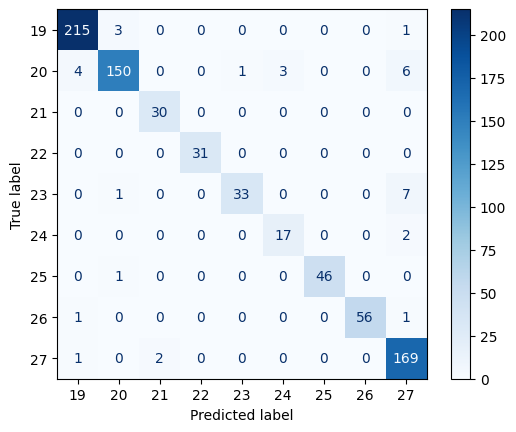

In [ ]:
#Matriz de confusión

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(label_mapping.keys()))
disp.plot(cmap="Blues")
plt.show()


In [ ]:
# Precision, Recall, F1-Score:

from sklearn.metrics import classification_report

# Convert label_mapping keys to strings before passing to classification_report
target_names = [str(key) for key in label_mapping.keys()]

print(classification_report(all_labels, all_preds, target_names=target_names))

              precision    recall  f1-score   support

          19       0.97      0.98      0.98       219
          20       0.97      0.91      0.94       164
          21       0.94      1.00      0.97        30
          22       1.00      1.00      1.00        31
          23       0.97      0.80      0.88        41
          24       0.85      0.89      0.87        19
          25       1.00      0.98      0.99        47
          26       1.00      0.97      0.98        58
          27       0.91      0.98      0.94       172

    accuracy                           0.96       781
   macro avg       0.96      0.95      0.95       781
weighted avg       0.96      0.96      0.96       781



###4. Generación de valor

In [ ]:
costo_por_hora = 5416  # Salario por hora
costo_por_registro_manual = (costo_por_hora / 60)*0.5  # Suponiendo que un registro manual se tarda 0.5 minuto

print(f"El costo por registro manual es de: {costo_por_registro_manual:.2f}")

El costo por registro manual es de: 45.13


In [ ]:
# Calcular el costo total con tiempo adicional
tiempo_adicional_por_error = 0.1666  # tiempo adicional 10 Segundos
costo_tiempo_adicional_total = (costo_por_hora/60)*tiempo_adicional_por_error

print(f"El costo total por errores con tiempo adicional es de: {costo_tiempo_adicional_total:.2f}")

El costo total por errores con tiempo adicional es de: 15.04


In [ ]:
a = costo_por_registro_manual - (1- 0.96)*costo_tiempo_adicional_total
print(f"El valor de la ganancia ajustada es : {a:.2f}")

El valor de la ganancia ajustada es : 44.53


In [ ]:
# Calculo ROI con promedio de ventas de 12000 productos por mes

productos = 12000
acc = 0.96
ganancia_mensual = productos*acc*a

# Tomando un valor de implementación de 1500000.
costo_implemnetacion= 1500000

meses_equi= costo_implemnetacion/ganancia_mensual

print(f"La ganancia mensua es de: {ganancia_mensual:.2f}")

print(f"El costo de implementación es de: {costo_implemnetacion:.2f}")


La ganancia mensua es de: 513006.29
El costo de implementación es de: 1500000.00


1. **Estimación de Costos**
  * **Costo de tiempo asociado al registro de prodcutos**
    * Teniendo un tiempo esperado de registro manual por producto de 30 segundos
    * Costo labora por hora de un empleado de supermecado es de $5.416
    * Tenemos un costo de tiempo por producto
    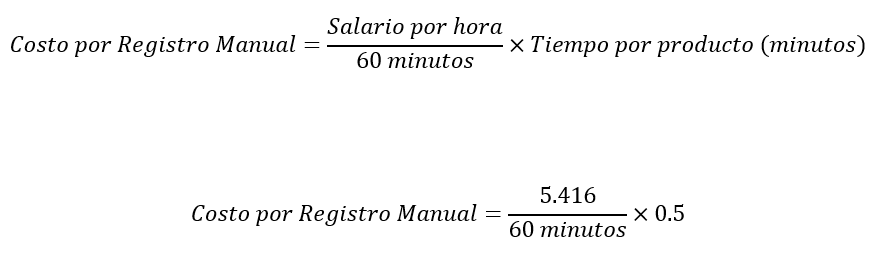
**Costo por porducto=** 45.13 pesos


  * **Ahorro de tiempo por el modelo**
    
    El modelo que automatiza el registro de los productos reduce el tiempo de registro por producto a 2 segundos, lo cual nos da la siguiente formula para calcular el ahorro del modelo
    
    Ahorro por producto = Costo por Registro manuel - costo del modelo por predicción teniendo un costo de modelo por predicción proximo a ce se obtiene un valor aproximado de ahorro de 45.13 pesos.


  * **Costo Asociado a los errores del modelo**  
  Si el modelo clasifica incorrectamente un producto, podria haber costos adiciones como el tiempo extra del empleado para corregir el error (10 segundos), para calcular dicho impacto se realiza el siguiente calculo.
  
 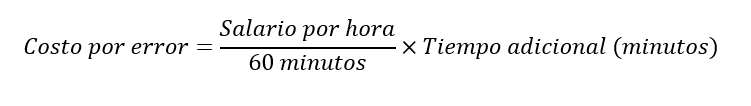

    **Costo por Error=** 15.04 pesos


  * Gracias a que nuestro modelo tiene un accuracy de **96%** la ganancia ajustada por producto seria:

  Costo promedio por producto = (1-Accuracy) x Costo por error

  * Ganancia Ajustada

    Tenidendo el valor de costo por error podemos calcular la ganancia ajustada.

    Ganancia ajustada = Ganancia - costo por error  

    Ganancia ajustada = 45.13 - (1 - Accuracy) x Costo por error
    
    Ganancia Ajustada = 44.53






**Calculo de ROI**

Con un promedio mensual de ventas de 12000 producto se calcula la ganancia mensual con la implmentacion del modelo:

Ganancia mensual = Productos mensuales x accuracy x Ahorro real por producto

Ganancia mensual = 12000 x 0.96 x 44.53

**Ganancia mensual = 512985.6**

Con un costo de implementación de **1'500000** para el proyecto tenemos un punto de equilibrio

Meses para equilibrio = (Costo Implementacion)/(Ganancia Mensual)

Meses para equilibrio = 1500000/512985.6

**Meses para equilibrio = 2.92 meses**


###5. Insights



1. **Eficiencia operativa:**
  * El modelo optimiza la velocidad del proceso de registro de los productos lo que gener una optimización de aproximadamente el 80%
  * La capacidad del modelo para identificar automáticamente los productos reduce la dependencia de los empleados en las tarea repetitivas, permitiendo enfocarse en ectividades de mayor valor.
  * Al disminuir los tiempos de espera en las filas y simplificar el proceso de pago la persepción de servicio mejora frente al cliente y generara fidelización de los mismos.

2. **Viabilidad económica**
  * Con una ganancia proyectada de 512,985.6 aproximada mensual el modelo genera ahorros reales y significativos para la empresa
  * El punto de equilibrio es alcanzado en mesno de 3 meses para la PoC lo que demuestra que la implementación total del proyecto es viable.
  * Superando el punto de equilibrio la empresa contara con un flujo de ingresos que le permitira una expanión.

3. **Transformación tecnológica**
  * Este tipo de proyectos se alinea con la tendencia de digitalización en la que la tecnología desempeña un papel clave en la optimización de las operaciones y mejor de la expereincia del cliente
  * La imlpementación de este tipo de proyecto genera una vetaja competitiva prosicinando a a empresa como liden en inovacion en su sector.

  